<a href="https://colab.research.google.com/github/Phuonghang120/Scheduling-Capstone/blob/main/Genetic%20algorithm%20of%20flexible%20flowshop%20scheduling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import random
import time
import matplotlib.pyplot as plt
import numpy as np
job_quantity        = 10
machine_quantity    = 97
first_stg_machine   = 5
second_stg_machine  = 15
third_stg_machine   = 65
fourth_stg_machine  = 97

selection_ratio        = 0.7
population_size        = 500
P_crossover            = 1
seq_crossover_gap      = 2
config_crossover_gap   = 5
conf_mutation_quantity = 5
max_calculate_time     = 4800
convergence_threshold  = 1000
Stage_data = {0 : {'se': 480, 'b':  50, 'v': 14.40, 'u':10.00 },
              1 : {'se': 300, 'b': 290, 'v':  9.10, 'u': 8.16},
              2 : {'se': 120, 'b':  92, 'v':  1.12, 'u': 1.11},
              3 : {'se': 360, 'b':   0, 'v':  1.94, 'u': 2.10}}
release = {1:0, 2:3960, 3:5280, 4:5280, 5:5280, 6:5280, 7:6600, 8:6600, 9:6600,10:6600}
due_date = {1:5280, 2:22440, 3:56760, 4:43560, 5:56760, 6:10560, 7:52800, 8:34320,9: 10560, 10:26400}
p = {(1, 0) : 362,   (1, 1) : 965,   (1,2) : 238,   (1,3) : 1946,
     (2, 0) : 49035, (2, 1) : 40191, (2,2) : 32181, (2,3) : 29444,
     (3, 0) : 186018,(3, 1) : 150587,(3,2) : 122808,(3,3) : 106834,
     (4, 0) : 93010, (4, 1) : 75631, (4,2) : 61041, (4,3) : 54288,
     (5, 0) : 186018,(5, 1) : 150587,(5,2) : 122080,(5,3) : 106834,
     (6, 0) : 929,   (6, 1) : 1422,  (6,2) : 610,   (6,3) : 2266,
     (7, 0) : 185631,(7, 1) : 150275,(7,2) : 121826,(7,3) : 106615,
     (8, 0) : 14082, (8, 1) : 12022, (8,2) : 9242,  (8,3) : 9697,
     (9, 0) : 521,   (9, 1) : 1093,  (9,2) : 324,   (9,3) : 2035,
     (10, 0): 33243, (10, 1): 27464, (10,2): 21817, (10,3): 20522}
stages_intervals = [(0, first_stg_machine),
                        (first_stg_machine, second_stg_machine),
                        (second_stg_machine, third_stg_machine),
                        (third_stg_machine, fourth_stg_machine)]
# GENERATE CHROMOSOME
def generate_chromosome(job_quantity, machine_quantity):

    # Part 1: Create sequence chromosome
    sequence_chromosome = random.sample(range(1, job_quantity+1), job_quantity)

    # Part 2: Create configuration chromosome
    """ To create configuration chromosome, A requirement is that the job be assigned to one machine, at least.
        Randomly generating a long binary string would take too much time,
        so randomly generating each stage and combining them will reduce calculating time.  """

    def generate_valid_stage(start, end):
        stage_length = end - start
        while True:
            stage_valid = [random.randint(0, 1) for _ in range(stage_length)]
            if any(stage_valid):  #Ensure that the job is assigned to 1 machine at least
                return stage_valid

    def configuration_chromosome(machine_quantity):
        stages_intervals = [(0, first_stg_machine),
                            (first_stg_machine, second_stg_machine),
                            (second_stg_machine, third_stg_machine),
                            (third_stg_machine, fourth_stg_machine)]
        binary_sequence = []
        for start, end in stages_intervals:     # Valid binary strings are combined
            binary_sequence.extend(generate_valid_stage(start, end))
        return binary_sequence

    # Part 3: Fully chromosome
    chromosome = [(job, configuration_chromosome(machine_quantity)) for job in sequence_chromosome]

    # Bonus part: x variables x[j,k,m]
    x = {}
    x = {(job, m): binary_config[m] for job, binary_config in chromosome for m in range(machine_quantity)}
    return chromosome, x, sequence_chromosome
# FITNESS FUNCTION
chromosome, x, sequence_chromosome = generate_chromosome(job_quantity, machine_quantity)
def fitness_function(parameter, x, sequence_chromosome):
    se, b, v, u = parameter
    s, c, Mc,Ms, Ps, Pc, SR, CR, ST, CT, cmax, dd, T = {}, {}, {}, {}, {}, {}, {}, {}, {}, {}, {},{},{}

    # Define stage interval again
    stages_intervals = [(0, first_stg_machine),
                        (first_stg_machine, second_stg_machine),
                        (second_stg_machine, third_stg_machine),
                        (third_stg_machine, fourth_stg_machine)]
    stage_list, interval_list = [],[]
    for f, (st, e) in enumerate(stages_intervals):
        stage_list.append(f)
        interval_list.append((st, e))

    "First stage k = 0"
    # First job
    j = sequence_chromosome[0]
    for m in range(first_stg_machine):
        setz0 = []
        setc0 = []
        (st,e) = interval_list[0]
        if x[(j,m)] == 0:
            s[(j,m)] = 0
            c[(j,m)] = s[(j,m)]
        else:
            s[(j,m)] = release[j]
            c[(j,m)] = s[(j,m)] + p[(j,0)]/(Stage_data[0]['v']*
                                            sum([x[(j,m1)] for m1 in range(st,e)]))
        SR[m] = s[(j,m)]
        CR[m] = c[(j,m)]

      # set of machine at first stage
    for mm in range(st,e):
        if x[(j,mm)] == 1:
            setz0.append(s[(j,mm)])
            setc0.append(c[(j,mm)])
    ST[(j,0)] = max(setz0)
    CT[(j,0)] = max(setc0)

   # The others
    for jj in sequence_chromosome[0:]:
        setz0 = []
        setc0 = []
        (st,e) = interval_list[0]
        for m in range(st,e):
            if x[(jj,m)] == 0:
                s[(jj,m)] = CR[m]
                c[(jj,m)] = s[(jj,m)]
            else:
                s[(jj,m)] = max((CT[(j,0)] + Stage_data[0]['se']*sum([x[jj,m6] for m6 in range(st,e)])) ,release[jj])
                c[(jj,m)] = s[(jj,m)] + p[(jj,0)]/(Stage_data[0]['v']* sum([x[(jj,m1)] for m1 in range(st,e)]))
            SR[m] = s[(jj,m)]
            CR[m]= c[(jj,m)]

        for mm in range(st,e):
            if x[(jj,mm)] == 1:
                setz0.append(s[(jj,mm)])
                setc0.append(c[(jj,mm)])
        ST[(jj,0)] = max(setz0)
        CT[(jj,0)] = max(setc0)

    "The rest k > 0"
    for k in stage_list[1:]:
        # First job
        j = sequence_chromosome[0]
        setz1, setc1 = [], []
        (st,e) = interval_list[k]
        for m in range(st,e):
            if x[(j,m)] == 0:
                Ms[(j,m)] = ST[(j,k-1)]
                Mc[(j,m)] = Ms[(j,m)]
                Ps[(j,m)] = ST[(j,k-1)]
                Pc[(j,m)] = Ps[(j,m)]
            else:
                (st,e) = interval_list[k]
                (stt,ee) = interval_list[k-1]
                Mc[(j,m)] = CT[(j,k-1)] + ((sum([x[j,m1] for m1 in range(stt,ee)]) *Stage_data[k]['b']*Stage_data[k-1]['v'])/(sum([x[j,m2] for m2 in range(st,e)])*Stage_data[k]['u']))
                Ms[(j,m)] = Mc[(j,m)] - p[(j,k)]/(Stage_data[k]['v']* sum([x[j,m3] for m3 in range(st,e)]))
                Ps[(j,m)] = ST[(j,k-1)] + ((sum([x[j,m4] for m4 in range(st,e)]) *Stage_data[k]['b'])/ sum([x[j,m5] for m5 in range(stt,ee)]))
                Pc[(j,m)] = Ps[(j,m)] + p[(j,k)]/(Stage_data[k]['v']* sum([x[j,m3] for m3 in range(st,e)]))

            s[(j,m)] = max(Ms[(j,m)],Ps[(j,m)])
            c[(j,m)] = s[(j,m)]+p[(j,k)]/(Stage_data[k]['v']* sum([x[j,m6] for m6 in range(st,e)]))
            SR[m] = s[(j,m)]
            CR[m] = c[(j,m)]
        for mm in range(st,e):
            if x[(j,mm)] == 1:
                setz1.append(s[(j,mm)])
                setc1.append(c[(j,mm)])
        ST[(j,k)] = max(setz1)
        CT[(j,k)] = max(setc1)

        # The others
        for jj in sequence_chromosome[1:]:
            setzk, setck = [], []
            (st,e) = interval_list[k]
            for m in range(st,e):
                if x[(jj,m)] == 0:
                    Ms[(jj,m)] = ST[(jj,k-1)]
                    Mc[(jj,m)] = ST[(jj,k-1)]
                    Ps[(jj,m)] = ST[(jj,k-1)]
                    Pc[(jj,m)] = ST[(jj,k-1)]
                else:
                    (st,e) = interval_list[k]
                    (stt,ee) = interval_list[k-1]
                    Mc[(jj,m)] = CT[(jj,k-1)] + ((sum([x[jj,m1] for m1 in range(stt,ee)]) *Stage_data[k]['b']*Stage_data[k-1]['v'])/(sum([x[jj,m2] for m2 in range(st,e)])*Stage_data[k]['u']))
                    Ms[(jj,m)] = Mc[(jj,m)] - p[(jj,k)]/(Stage_data[k]['v']* sum([x[jj,m3] for m3 in range(st,e)]))
                    Ps[(jj,m)] = ST[(jj,k-1)] + ((sum([x[jj,m4] for m4 in range(st,e)])*Stage_data[k]['b'])/ sum([x[jj,m5] for m5 in range(stt,ee)]))
                    Pc[(jj,m)] = Ps[(jj,m)] + p[(jj,k)]/(Stage_data[k]['v']* sum([x[jj,m3] for m3 in range(st,e)]))

                s[(jj,m)] = max(Ms[(jj,m)],Ps[(jj,m)],(CR[m] + Stage_data[k]['se']*sum([x[jj,m6] for m6 in range(st,e)])))
                c[(jj,m)] = s[(jj,m)]+p[(jj,k)]/(Stage_data[k]['v']* sum([x[jj,m6] for m6 in range(st,e)]))
                SR[m] = s[(jj,m)]
                CR[m] = c[(jj,m)]
            for mm in range(st,e):
                if x[(jj,mm)] == 1:
                    setzk.append(s[(jj,mm)])
                    setck.append(c[(jj,mm)])
            ST[(jj,k)] = max(setzk)
            CT[(jj,k)] = max(setck)
    Laterness = 0
    k = max(stage_list)
    for j in sequence_chromosome:
        cmax[j] = CT[j,k]
        T[j] = cmax[j] - due_date[j]
        Laterness = Laterness + T[j]
    return Laterness, ST,CT
# INITIALIZE POPULATION
class Individual:
    def __init__(self, id, chromosome,seq_chromosome, Laterness):
        self.id = id
        self.chromosome = chromosome
        self.seq_chromosome = sequence_chromosome
        self.Laterness = Laterness
    def __repr__(self):
        return f"Individual(ID={self.id},Laterness={self.Laterness})"

def initialize_population(population_size, job_quantity, machine_quantity, parameter):
    population = []
    for i in range(population_size):
        chromosome, x, sequence_chromosome = generate_chromosome(job_quantity, machine_quantity)
        Laterness, ST, CT = fitness_function(parameter, x, sequence_chromosome)
        individual = {"id": i, "chromosome": chromosome, "seq_chromosome":sequence_chromosome,
                      "Laterness": Laterness, "s": ST, "c": CT}
        population.append(individual)
    return population
# PARENTS SELECTION (ROULETTE-WHEEL)
""" The fitness value is calculated by cmax_value
    Each individual has a fitness value to selection
    The bigger fitness value the higher probability to selection """
def roulette_wheel_selection(population, selection_ratio):
    Laterness_values = [ind["Laterness"] for ind in population]
    f_max = max(Laterness_values)
    f_min = min(Laterness_values)

    if f_max == f_min:
        fitness_values = [1 for _ in population]
    else:
        fitness_values = [(f_max - ind["Laterness"]) / (f_max - f_min) for ind in population]

    total_fitness = sum(fitness_values)
    probabilities = [fit / total_fitness for fit in fitness_values]

    cumulative_probabilities = []   # compete cumulative probabilities
    cumulative_sum = 0
    for prob in probabilities:
        cumulative_sum += prob
        cumulative_probabilities.append(cumulative_sum)

    num_selected = int(len(population) * selection_ratio) # number of individual selected
    selected_population = []

    while len(selected_population) < num_selected:    # selecting individual follow roulette wheel rules
        rand_val = random.uniform(0, 1)
        for i, cumulative_prob in enumerate(cumulative_probabilities):
            if rand_val <= cumulative_prob and population[i] not in selected_population:
                selected_population.append(population[i])
                break

    return selected_population
# CROSSOVER
""" A chromosome has two elements. Sequence chromosome (SC) and configuration chromosome(CC).
    We need to perform crossover two types of genes independently
    The SCs of parents are crossovers with each other
    The CC for each job in the father's SC is crossed over with the corresponding CC in the mother's SC,
    finally, all the CCs of the children will be re-sequenced to follow the children's SC """
def two_point_crossover_bin(parent1, parent2, crossover_gap):
    length = len(parent1)
    point1 = random.randint(0, length - crossover_gap - 1)
    point2 = point1 + crossover_gap

    child1 = parent1[:point1] + parent2[point1:point2] + parent1[point2:]
    child2 = parent2[:point1] + parent1[point1:point2] + parent2[point2:]
    return child1, child2

def pmx_crossover(child_base, parent, cxpoint1, cxpoint2):
    size = len(child_base)
    child = [None] * size
    child[cxpoint1:cxpoint2] = parent[cxpoint1:cxpoint2] # Copy crossed gene from parent to child

    mapping = {}
    for i in range(cxpoint1, cxpoint2):
        mapping[parent[i]] = child_base[i]

    for i in list(range(0, cxpoint1)) + list(range(cxpoint2, size)):
        gene = child_base[i]
        while gene in child[cxpoint1:cxpoint2]:
            gene = mapping[gene]
        child[i] = gene
    return child

def crossover(selected_population, P_crossover, seq_crossover_gap, config_crossover_gap):
    # Sorting individual list by cmax value, smallest to largest
    selected_population = sorted(selected_population, key=lambda ind: ind["Laterness"])
    child_population = []  # List for children

    # Browse pair of parents in order
    for i in range(0, len(selected_population) - 1, 2):
        parent1 = selected_population[i]
        parent2 = selected_population[i + 1]

        # Crossover this parents or not?
        if random.uniform(0, 1) > P_crossover:
            continue

        # Extract sequence chromosome
        seq_parent1 = [job for job, _ in parent1["chromosome"]]
        seq_parent2 = [job for job, _ in parent2["chromosome"]]

        length = len(seq_parent1)
        if length < seq_crossover_gap:
            cxpoint1 = 0
            cxpoint2 = length
        else:
            cxpoint1 = random.randint(0, length - seq_crossover_gap)
            cxpoint2 = cxpoint1 + seq_crossover_gap

        # Crossover sequence chromosome with PMX method
        seq_child0 = pmx_crossover(seq_parent1, seq_parent2, cxpoint1, cxpoint2)
        seq_child1 = pmx_crossover(seq_parent2, seq_parent1, cxpoint1, cxpoint2)

        # Crossover configuration chromosome
        config_child0 = []
        config_child1 = []
        for job0, job1 in zip(seq_child0, seq_child1):
            conf1 = next(conf for j, conf in parent1["chromosome"] if j == job0)
            conf2 = next(conf for j, conf in parent2["chromosome"] if j == job1)
            new_conf0, new_conf1 = two_point_crossover_bin(conf1, conf2, config_crossover_gap)
            config_child0.append((job0, new_conf0))
            config_child1.append((job1, new_conf1))

        child0 = {"id": len(child_population),"chromosome": config_child0,"seq_chromosome": seq_child0,
                  "Laterness": None}
        child_population.append(child0)

        child1 = {"id": len(child_population),"chromosome": config_child1,"seq_chromosome": seq_child1,
                  "Laterness": None}
        child_population.append(child1)

    return child_population
# MUTATION
""" Performing mutation of two types of genes is independent, too.
    Mutation of SCs is the exchange two jobs in the crossover interval.
    Mutation of CCs is the reversal of some bit in them, 1 to 0 or 0 to 1 """

def mutate_individual(individual, seq_crossover_gap, conf_mutation_quantity):
    # create a copy of old chromosome to do not change it.
    mutated_chromosome = [(job, config.copy()) for job, config in individual["chromosome"]]

    '''Mutation for sequence chromosome'''
    # if seq_crossover_gap has enough length, swap the first pair.
    if len(mutated_chromosome) >= seq_crossover_gap and seq_crossover_gap >= 2:
        mutated_chromosome[0], mutated_chromosome[1] = mutated_chromosome[1], mutated_chromosome[0]

    ''' Mutation for configuration chromosome '''
    if mutated_chromosome:
        config_length = len(mutated_chromosome[0][1])
        mutation_positions = random.sample(range(config_length), conf_mutation_quantity) # random position for mutation in CC
        # if all of machines in any stage are equal to 0, swap random one machine into 1
        for idx, (job, config) in enumerate(mutated_chromosome):
            stage_intervals = [
                (0, first_stg_machine),
                (first_stg_machine, second_stg_machine),
                (second_stg_machine, third_stg_machine),
                (third_stg_machine, fourth_stg_machine)]
            for start, end in stage_intervals:
                if sum(config[start:end]) == 0:
                    pos = random.randint(start, end - 1)
                    config[pos] = 1
        for idx, (job, config) in enumerate(mutated_chromosome):
            for pos in mutation_positions:
                stage_interval = None
                if 0 <= pos < first_stg_machine:
                    stage_interval = (0, first_stg_machine)
                elif first_stg_machine <= pos < second_stg_machine:
                    stage_interval = (first_stg_machine, second_stg_machine)
                elif second_stg_machine <= pos < third_stg_machine:
                    stage_interval = (second_stg_machine, third_stg_machine)
                elif third_stg_machine <= pos < fourth_stg_machine:
                    stage_interval = (third_stg_machine, fourth_stg_machine)
                else:
                    continue

                start, end = stage_interval
                current_bit = config[pos]

                if current_bit == 1:   # instance turn 1 into 0, if stage have only 1 element, skip
                    if sum(config[start:end]) > 1:
                        config[pos] = 0
                else:                   # instance turn 0 into 1, always valid
                    config[pos] = 1
            mutated_chromosome[idx] = (job, config)

    mutated_individual = {"id": individual["id"],"chromosome": mutated_chromosome,
                          "seq_chromosome": mutated_chromosome,"Laterness": None}
    return mutated_individual

def mutation(child_population, seq_crossover_gap, conf_mutation_quantity):
    mutated_population = []

    # Apply mutation only to individuals that have gone through crossover
    for individual in child_population:
        mutated_population.append(mutate_individual(individual, seq_crossover_gap, conf_mutation_quantity))

    return mutated_population
# UPDATE POPULATION

def update_population(population, child_population, fitness_function, parameter, machine_quantity, population_size):
    temp_population = population + child_population

    # re-calculate objective
    for individual in temp_population:
        sequence_chromosome = [job for job, _ in individual["chromosome"]]
        x = {}
        for job, config in individual["chromosome"]:
            for m in range(machine_quantity):
                x[(job, m)] = config[m]

        Laterness, ST, CT = fitness_function(parameter, x, sequence_chromosome)
        individual["Laterness"] = Laterness
        individual["s"] = ST
        individual["c"] = CT
        individual["x"] = x

    temp_population.sort(key=lambda ind: ind["Laterness"])

    # Select best individuals
    new_population = temp_population[:population_size]
    return new_population
""" The stopping condition is not exceed the allowed time  """
def genetic_algorithm(population_size, job_quantity, machine_quantity, parameter,
                      selection_ratio, P_crossover, seq_crossover_gap, config_crossover_gap,
                      conf_mutation_quantity, max_calculate_time, convergence_threshold):
    population = initialize_population(population_size, job_quantity, machine_quantity, parameter)
    generation = 0
    best_total_laterness = float('inf')
    stagnation_count = 0    # count not improved generation
    start_time = time.time()  # start counting

    # Stopping criteria
    while stagnation_count < convergence_threshold:
        if time.time() - start_time > max_calculate_time: # Check time
            break
        selected_population = roulette_wheel_selection(population, selection_ratio)
        children_population = crossover(selected_population, P_crossover, seq_crossover_gap, config_crossover_gap)
        mutated_children = mutation(children_population, seq_crossover_gap, conf_mutation_quantity)
        population = update_population(population, mutated_children, fitness_function, parameter, machine_quantity, population_size)

        # check converging criteria
        current_best = min(ind["Laterness"] for ind in population)
        if current_best < best_total_laterness:
            best_total_laterness = current_best
            stagnation_count = 0
        else:
            stagnation_count += 1

        generation += 1
        print(f"Generation {generation} Best total laterness = {best_total_laterness}")
    return population

final_population = genetic_algorithm(
    population_size,
    job_quantity,
    machine_quantity,
    Stage_data,
    selection_ratio,
    P_crossover,
    seq_crossover_gap,
    config_crossover_gap,
    conf_mutation_quantity,
    max_calculate_time,
    convergence_threshold)

# Print the best population
print("Final Population:")
for individual in final_population:
    print(individual)

# Find the best individual
best_individual = min(final_population, key=lambda ind: ind["Laterness"])
best_total_laterness = best_individual["Laterness"]
best_sequence = [job for job, _ in best_individual["chromosome"]]
best_configuration = [config for _, config in best_individual["chromosome"]]

# Print results
print("\nBest Individual:")
print("Best total laterness:", best_total_laterness)
print("Best Sequence:", best_sequence)
print("Best Configuration:", best_configuration)

Generation 1 Best total laterness = -11502.618463724182
Generation 2 Best total laterness = -11502.618463724182
Generation 3 Best total laterness = -11502.618463724182
Generation 4 Best total laterness = -13548.213939554149
Generation 5 Best total laterness = -24750.567064917435
Generation 6 Best total laterness = -26651.120081236048
Generation 7 Best total laterness = -28343.980979552107
Generation 8 Best total laterness = -28343.980979552107
Generation 9 Best total laterness = -28343.980979552107
Generation 10 Best total laterness = -32698.306449682386
Generation 11 Best total laterness = -32698.306449682386
Generation 12 Best total laterness = -37766.71064463537
Generation 13 Best total laterness = -37766.71064463537
Generation 14 Best total laterness = -37766.71064463537
Generation 15 Best total laterness = -37766.71064463537
Generation 16 Best total laterness = -37766.71064463537
Generation 17 Best total laterness = -40263.23868010345
Generation 18 Best total laterness = -40263.23

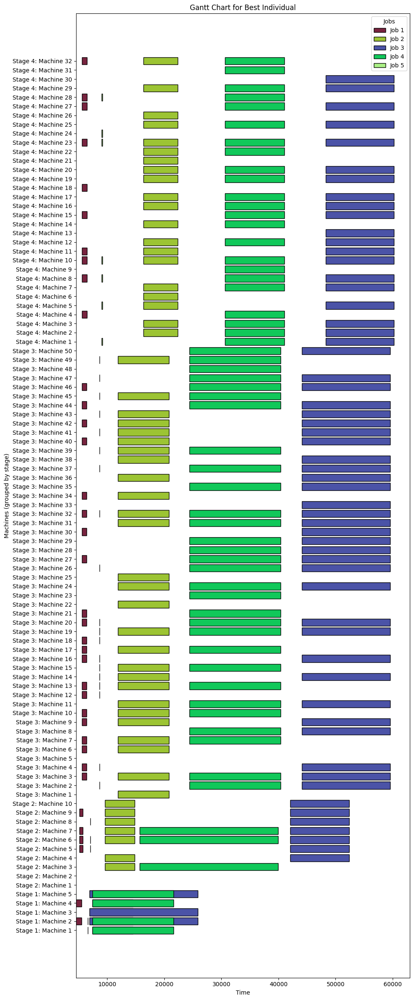

In [ ]:
import matplotlib.pyplot as plt
import random
from matplotlib.patches import Patch

def plot_gantt_chart_from_fitness(best_individual, stages_intervals, machine_quantity):
    fig, ax = plt.subplots(figsize=(10, 24))

    ST = best_individual["s"]  # Start times indexed by (job, stage)
    CT = best_individual["c"]  # Completion times indexed by (job, stage)
    x = best_individual["x"]   # Machine-job assignment indexed by (job, machine)

    jobs = [job for job, _ in best_individual["chromosome"]]
    unique_jobs = sorted(set(jobs))
    colors = {job: (random.random(), random.random(), random.random()) for job in unique_jobs}

    for m in range(machine_quantity):
        assigned_stage = None
        for job in unique_jobs:
            if (job, m) in x and x[(job, m)] == 1:
                for stage, (start_idx, end_idx) in enumerate(stages_intervals):
                    if start_idx <= m < end_idx:
                        assigned_stage = stage
                        break

                if assigned_stage is not None and (job, assigned_stage) in ST and (job, assigned_stage) in CT:
                    start_time = ST[(job, assigned_stage)]
                    finish_time = CT[(job, assigned_stage)]
                    ax.barh(m, finish_time - start_time, left=start_time, height=0.8,
                            color=colors[job], edgecolor='black')

    # Set y-axis labels
    yticks = list(range(machine_quantity))
    yticklabels = []
    for m in range(machine_quantity):
        label = ""
        for stage, (start_idx, end_idx) in enumerate(stages_intervals):
            if start_idx <= m < end_idx:
                label = f"Stage {stage+1}: Machine {m - start_idx + 1}"
                break
        yticklabels.append(label)

    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)
    ax.set_xlabel("Time")
    ax.set_ylabel("Machines (grouped by stage)")
    ax.set_title("Gantt Chart for Best Individual")

    # Create legend
    legend_elements = [Patch(facecolor=colors[job], edgecolor='black', label=f'Job {job}') for job in unique_jobs]
    ax.legend(handles=legend_elements, loc='upper right', title="Jobs")

    plt.tight_layout()
    plt.show()
plot_gantt_chart_from_fitness(best_individual, stages_intervals, machine_quantity)

In [ ]:
import pyomo.environ as pyo
from pyomo.environ import *
from pyomo.opt import SolverFactory
# Data
setJ = [1, 2, 3]     # job
setK = [1, 2, 3]        # stages
KM = {                  # Machines in each stage
      1: [1, 2],
      2: [1, 2],
      3: [1, 2, 3]}
setMK = [ m for k in setK for m in KM[k]]   # Machines
setM = [1,2,3]
KL = {                                      # Machines in each stage
      1: [1, 2],
      2: [1, 2],
      3: [1, 2, 3]}
setLK = [ l for k in setK for l in KL[k]]   # splitting-job ways
setL = [1,2,3]                          # release time of each job
Due_date = {1:400,2:1200, 3:900 }
Job = {1:40,2:20,3:20}                # release time of each job
Stage = {    # setuptime, batching-time,speed-of-make, speed-of-receive
    1 : {'se': 100, 'b':  0, 'v': 15   , 'u':1   },
    2 : {'se': 50 , 'b':  42,'v':  2.72, 'u':3.34},
    3 : {'se': 50 , 'b': 180,'v':  8.4 , 'u':9.1 }}
p = {  # Processing time of j at kth stage
    (1, 1): 2800, (1, 2): 2284, (1, 3): 2172,
    (2, 1): 2100, (2, 2): 1714, (2, 3): 1550,
    (3, 1): 3500, (3, 2): 2856, (3, 3): 2520}
ratio = {         # Ratio of splitting-job ways
        (1, 1): 1, (1, 2): 0.5, (1, 3): 1/3,
        (2, 1): 1, (2, 2): 0.5, (1, 3): 1/3,
        (3, 1): 1, (3, 2): 0.5, (3, 3): 1/3,}
model = pyo.ConcreteModel()
# Indices and sets
model.J     = pyo.Set(initialize = setJ)                  #set of jobs
model.K     = pyo.Set(initialize = setK)                  #set of stages
model.M     = pyo.Set(initialize = setM)                  #set of machines
model.L     = pyo.Set(initialize = setL)                  #set of splitting-job ways
model.Stage = pyo.Set(initialize = Stage.keys(), dimen=1) #set for parameter
model.Job   = pyo.Set(initialize = Job.keys(), dimen=1)   #set for parameter
model.Due   = pyo.Set(initialize = Due_date.keys(), dimen=1)
# Parameter
model.p = pyo.Param(model.J, model.K, initialize=p, default=0)
model.se= pyo.Param(model.Stage, initialize=lambda model, k: Stage[(k)]['se'])
model.b = pyo.Param(model.Stage, initialize=lambda model, k: Stage[(k)]['b'])
model.v = pyo.Param(model.Stage, initialize=lambda model, k: Stage[(k)]['v'])
model.u = pyo.Param(model.Stage, initialize=lambda model, k: Stage[(k)]['u'])
model.r = pyo.Param(model.Job  , initialize=lambda model, j: Job[(j)])
model.dd= pyo.Param(model.Due,   initialize=lambda model,dd: Due_date[(dd)])
model.ratio = pyo.Param(model.K, model.L, initialize=ratio, default=0)
# Variables
model.x = pyo.Var(model.J, model.K, model.M,domain=pyo.Binary)
model.z = pyo.Var(model.J, model.K, model.L,domain=pyo.Binary)
model.w = pyo.Var(model.J, model.K, model.M, model.L, domain = pyo.Binary)
model.y = pyo.Var(model.J, model.J, model.K, model.M, domain=pyo.Binary)
model.q = pyo.Var(model.J, model.K, model.M, bounds=(0,1),
                  domain = pyo.NonNegativeReals)
model.c = pyo.Var(model.J, model.K, model.M, bounds=(0,None),
                  domain = pyo.NonNegativeReals)
model.s = pyo.Var(model.J, model.K, model.M, bounds=(0,None),
                  domain = pyo.NonNegativeReals)
model.cmax = pyo.Var(model.J,bounds=(0, None),domain = pyo.NonNegativeReals)
model.T    = pyo.Var(model.J, bounds=(0,None), domain = pyo.NonNegativeReals)
model.tardiness = pyo.Var(bounds=(0,None), domain = pyo.NonNegativeReals)
# Notaion
J=model.J,K=model.K,M=model.M,p=model.p,dd = model.dd,se=model.se,b=model.b
r=model.r,v=model.v,u=model.u,x=model.x,z=model.z,w=model.w,y=model.y,q=model.q
c=model.c,s=model.s,ratio = model.ratio,cmax=model.cmax,T = model.T
tardiness = model.tardiness
# Constraints
# Constraints
model.C11 = pyo.ConstraintList()
for j in J:
    for k in K:
        for m in KM[k]:
            model.C11.add(expr= q[j,k,m] == sum([ratio[k,l]*w[j,k,m,l] for l in KL[k]]))
model.C12 = pyo.ConstraintList()
for j in J:
    for k in K:
        model.C12.add(expr= sum([q[j,k,m] for m in KM[k]]) == 1)
model.C13 = pyo.ConstraintList()
for j in J:
    for k in K:
        for m in KM[k]:
            model.C13.add(expr= q[j,k,m] <= x[j,k,m] )
model.C14 = pyo.ConstraintList()
for j in J:
    for k in K:
        for m in KM[k]:
            model.C14.add(expr= sum([w[j,k,m,l] for l in KL[k]]) <= 1)
model.C15 = pyo.ConstraintList()
for j in J:
    for k in K:
        for l in KL[k]:
            model.C15.add(expr= sum([w[j,k,m,l] for m in KM[k]]) == l * z[j,k,l])
model.C16 = pyo.ConstraintList()
for j in J:
    for k in K:
        model.C16.add(expr= sum([z[j,k,l] for l in KL[k]]) == 1)

model.C17 = pyo.ConstraintList()
for j in J:
    for m in KM[1]:
        model.C17.add(expr = s[j,1,m] >= r[j])
model.C18 = pyo.ConstraintList()
for j in J:
    for i in J:
        if i!= j:
            for k in K:
                for m in KM[k]:
                    for l in KL[k]:
                        model.C18.add(expr= s[i,k,m] >= s[j,k,m] + q[j,k,m]
                                      *p[j,k]/v[k] + l*se[k]
                                      - 100000*(3- w[i,k,m,l]- x[i,k,m]
                                      - x[j,k,m]) - 100000*(1-y[j,i,k,m]))
model.C19 = pyo.ConstraintList()
for j in J:
    for i in J:
        if i!= j:
            for k in K:
                for m in KM[k]:
                    for l in KL[k]:
                        model.C19.add(expr= s[j,k,m] >= s[i,k,m]
                                      + q[i,k,m]*p[i,k]/v[k] + l *se[k]
                                      - 100000*(3- w[j,k,m,l]- x[i,k,m]
                                                - x[j,k,m]) - 100000*y[j,i,k,m])
model.C20 = pyo.ConstraintList()
for j in J:
    for k in setK[1:]:
        for m in KM[k]:
            for l in KL[k]:
                for ll in KL[k-1]:
                    for d in KM[k-1]:
                        model.C20.add(expr= s[j,k,m] >=s[j,k-1,d]+ l*b[k]/ll
                                      + 100000*(w[j,k,m,l]+ z[j,k-1,ll]-2))
model.C21 = pyo.ConstraintList()
for j in J:
    for k in K:
        for m in KM[k]:
            model.C21.add(expr = s[j,k,m] == c[j,k,m] - q[j,k,m] *p[j,k]/v[k])
model.C22 = pyo.ConstraintList()
for j in J:
    for k in setK[1:]:
        for m in KM[k]:
            for l in KL[k]:
                for d in KM[d-1]:
                    for ll in KL[k-1]:
                        model.C22.add(expr= c[j,k,m] >= c[j,k-1,d] +
                                      ll*b[k]*v[k-1]/(u[k]*l)+
                                      100000*(w[j,k,m,l] + z[j,k-1,ll]-2) )
model.C23 = pyo.ConstraintList()
for j in J:
    for m in KM[max(setK)]:
        model.C23.add(expr = cmax[j] >= c[j,max(setK),m])

model.C24 = pyo.ConstraintList()
for j in J:
    model.C24.add(expr = T[j] >=  cmax[j] - dd[j])

model.C26 = pyo.ConstraintList()
model.C26.add(expr = tardiness == sum([T[j] for j in J]))
# Objective
model.obj = pyo.Objective(expr = tardiness, sense=pyo.minimize)
# Solver
opt = SolverFactory('gurobi')
#opt.options['MIPgap']=0
#opt.options['Timelimit']=2
result = opt.solve(model)#, tee = True)
model.pprint()